#**Stop signs image classsification**
## Project Tasks
Your job is to load the training images, create features, and train the model. You will then deploy the model to Code Engine so your manager can upload an image of a stop sign and your image classifier will classify the image and tell them to what accuracy it predicts it is correct. You will utilize CV Studio to develop this model and then deploy it as a web app by completing the tasks below.

Task 1: Gather and Upload Your Data

Task 2: Train Your Classifier

Task 3: Deploy Your Model

Task 4: Test Your Classifier

Task 5: Submit Your Assignment and Evaluate Your Peers

In [ ]:

!pip install tensorflow

In [ ]:
# Import the libraries we need to use in this lab
# Using the following line code to install the torchvision library
# !conda install -y torchvision

import keras
from keras.models import Sequential 
from keras.layers import Dense,Dropout
from keras.preprocessing.image import ImageDataGenerator 
from tensorflow.keras.applications import VGG16,ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.vgg16 import preprocess_input 
# from tensorflow.keras.applications.resnet50 import preprocess_input 
from sklearn.model_selection import train_test_split
# Used to graph data and loss curves
import matplotlib.pylab as plt
# Allows us to use arrays to manipulate and store data
import numpy as np
# Allows us to access the filesystem
import os  
from torch.utils.data import Dataset, DataLoader
import cv2
import glob

### Task 1: Gather and Upload Your Data

In [ ]:
# connect google drive to using files
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
# unzip the files
!unzip /content/gdrive/MyDrive/Classroom/not_stop.zip
!unzip /content/gdrive/MyDrive/Classroom/stop.zip
!unzip /content/gdrive/MyDrive/Classroom/test_set_stop_not_stop.zip

Archive:  /content/gdrive/MyDrive/Classroom/not_stop.zip
replace not_stop/189.jpg? [y]es, [n]o, [A]ll, [N]one, [r]ename: N
  inflating: not_stop/162.jpg        
  inflating: not_stop/176.jpg        
  inflating: not_stop/200.jpg        
  inflating: not_stop/177.jpg        
  inflating: not_stop/163.jpg        
  inflating: not_stop/188.jpg        
  inflating: not_stop/149.jpg        
  inflating: not_stop/175.jpg        
  inflating: not_stop/161.jpg        
  inflating: not_stop/160.jpg        
  inflating: not_stop/174.jpg        
  inflating: not_stop/148.jpg        
  inflating: not_stop/164.jpg        
  inflating: not_stop/158.jpg        
  inflating: not_stop/170.png        
  inflating: not_stop/.DS_Store      
  inflating: not_stop/153.jpeg       
  inflating: not_stop/159.jpg        
  inflating: not_stop/165.jpg        
  inflating: not_stop/167.jpg        
  inflating: not_stop/173.jpg        
  inflating: not_stop/172.jpg        
  inflating: not_stop/166.jpg        
  i

In [ ]:
stop_files=[os.path.join('/content/stop',file) for file in  os.listdir('/content/stop') if file.endswith(".jpg")]
stop_files.sort()
stop_files[0:3]

['/content/stop/1.jpg', '/content/stop/10.jpg', '/content/stop/100.jpg']

In [ ]:
not_stop_files=[os.path.join('/content/not_stop',file) for file in  os.listdir('/content/not_stop') if file.endswith(".jpg")]
not_stop_files.sort()
not_stop_files[0:3]

['/content/not_stop/101.jpg',
 '/content/not_stop/102.jpg',
 '/content/not_stop/103.jpg']

In [ ]:
test_files=[os.path.join('/content/test_set_stop_not_stop',file) for file in  os.listdir('/content/test_set_stop_not_stop') if file.endswith(".jpeg")]
test_files[0:3]

['/content/test_set_stop_not_stop/not_stop_4.jpeg',
 '/content/test_set_stop_not_stop/not_stop_3.jpeg',
 '/content/test_set_stop_not_stop/stop_1.jpeg']

In [ ]:
print("stop files: "+ str(len(stop_files)))
print("not stop files: "+ str(len(not_stop_files)))
print("test files: "+ str(len(test_files)))

stop files: 77
not stop files: 86
test files: 8


In [ ]:
number_of_samples = len(stop_files) + len(not_stop_files)

In [ ]:
number_of_samples

163

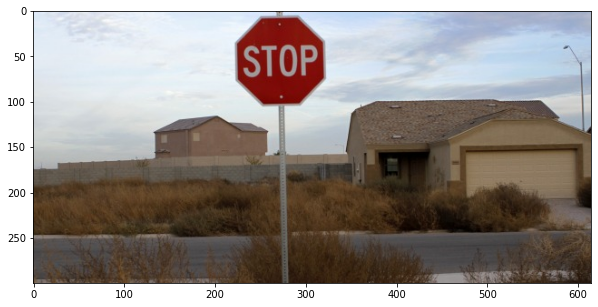

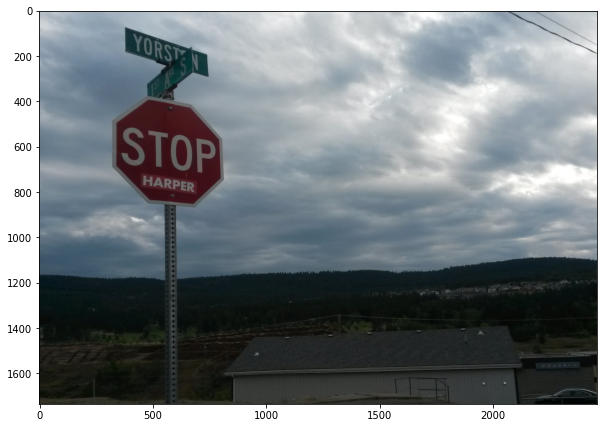

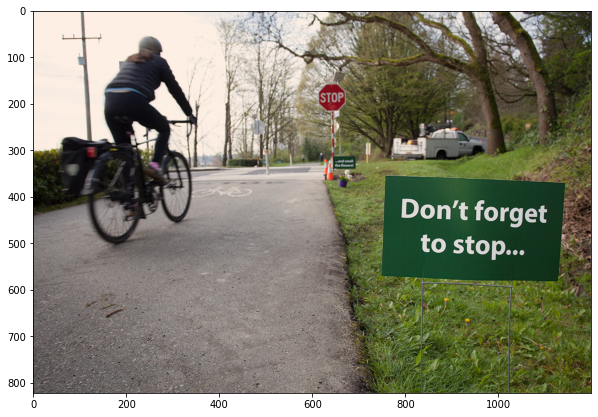

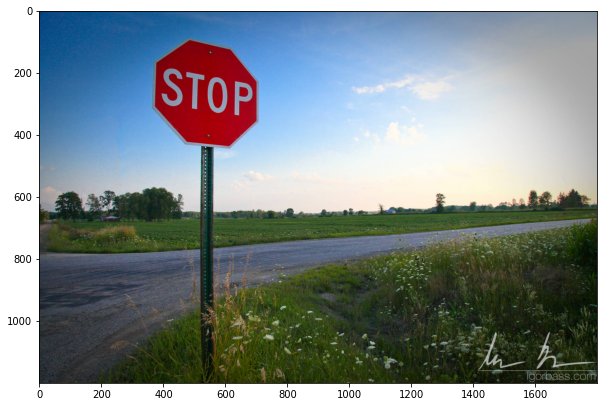

In [ ]:
for file in stop_files[0:4]:
    img = cv2.imread(file)
    plt.figure(figsize=(10,10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

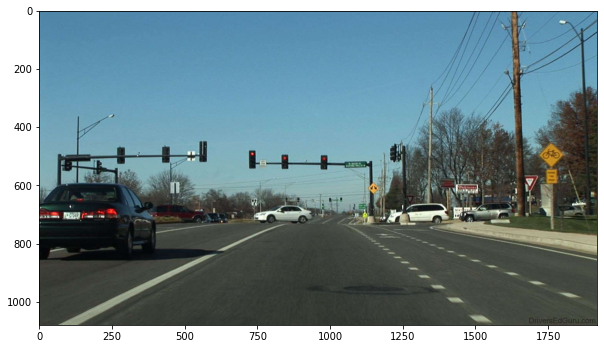

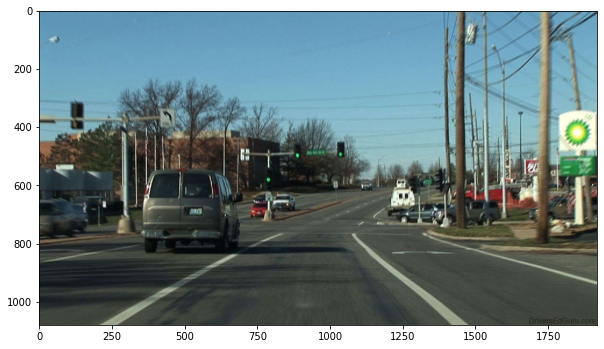

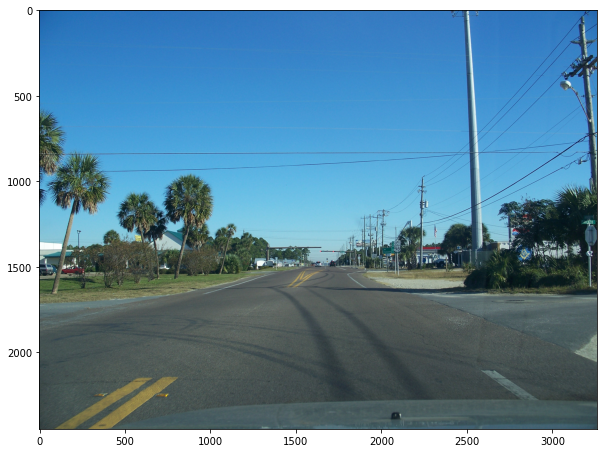

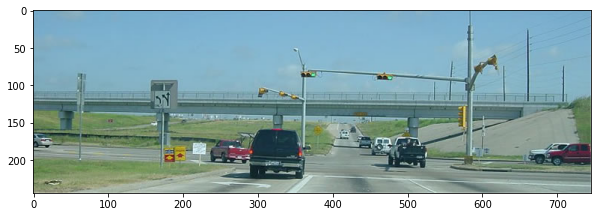

In [ ]:
for file in not_stop_files[0:4]:
    img = cv2.imread(file)
    plt.figure(figsize=(10,10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

In [ ]:
batch_size_training = 100 
batch_size_validation = 100 
image_resize = 224
num_classes = 2

In [ ]:
stop_files_path = '/content/train/stop'
not_stop_files_path = '/content/train/not_stop'
test_files_path = '/content/test_set_stop_not_stop'
stop_files=[os.path.join(stop_files_path,file) for file in  os.listdir(stop_files_path) if file.endswith(".jpg")]
not_stop_files=[os.path.join(not_stop_files_path,file) for file in  os.listdir(not_stop_files_path) if file.endswith(".jpg")]
test_files=[os.path.join(test_files_path,file) for file in  os.listdir(test_files_path) if file.endswith(".jpeg")]
all_files = stop_files + not_stop_files
label_train = []
for i in range (len(stop_files)):
  label_train.append(1)
for i in range (len(not_stop_files)):
  label_train.append(0)

X_train, X_val, y_train, y_val = train_test_split(all_files, label_train, test_size=0.05, random_state=1234)

In [ ]:
data_generator = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.20
)

train_generator = data_generator.flow_from_directory(
    '/content/train',
    target_size=(image_resize, image_resize),
    batch_size=batch_size_training, 
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
    )

validation_generator = data_generator.flow_from_directory(
    '/content/train',
    target_size=(image_resize, image_resize),
    batch_size=batch_size_validation,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
    )

Found 175 images belonging to 2 classes.
Found 43 images belonging to 2 classes.


In [ ]:
model = Sequential()
model.add(VGG16(
    include_top=False, 
    pooling='avg',
    weights='imagenet',
    ))
model.add(Dense(512,activation='relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes, activation='softmax'))
model.layers

In [ ]:
model.layers[0].trainable = False

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 dense (Dense)               (None, 512)               262656    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 2)                 1026      
                                                                 
Total params: 14,978,370
Trainable params: 263,682
Non-trainable params: 14,714,688
_________________________________________________________________


In [ ]:
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy']) 

In [ ]:
steps_per_epoch_training = len(train_generator)
steps_per_epoch_validation = len(validation_generator)
num_epochs = 15

In [ ]:
np.random.seed(1234)
fit_history = model.fit_generator( 
    train_generator,
    steps_per_epoch=steps_per_epoch_training,
    epochs=num_epochs,
    validation_data=validation_generator,
    validation_steps=steps_per_epoch_validation,
    verbose=1,
)

<ipython-input-23-7a44d4d63b5b>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  fit_history = model.fit_generator(


Epoch 1/15
2/2 [==============================] - 26s 15s/step - loss: 2.8989 - accuracy: 0.5829 - val_loss: 0.7817 - val_accuracy: 0.7209
Epoch 2/15
2/2 [==============================] - 8s 5s/step - loss: 1.6907 - accuracy: 0.7143 - val_loss: 1.3493 - val_accuracy: 0.8372
Epoch 3/15
2/2 [==============================] - 8s 4s/step - loss: 1.3517 - accuracy: 0.7657 - val_loss: 0.5755 - val_accuracy: 0.8605
Epoch 4/15
2/2 [==============================] - 8s 6s/step - loss: 0.6132 - accuracy: 0.8857 - val_loss: 0.5008 - val_accuracy: 0.8372
Epoch 5/15
2/2 [==============================] - 8s 4s/step - loss: 0.7058 - accuracy: 0.8457 - val_loss: 0.5170 - val_accuracy: 0.7907
Epoch 6/15
2/2 [==============================] - 8s 4s/step - loss: 0.4368 - accuracy: 0.9029 - val_loss: 0.2888 - val_accuracy: 0.9070
Epoch 7/15
2/2 [==============================] - 8s 5s/step - loss: 0.4884 - accuracy: 0.9029 - val_loss: 0.1784 - val_accuracy: 0.9302
Epoch 8/15
2/2 [=======================

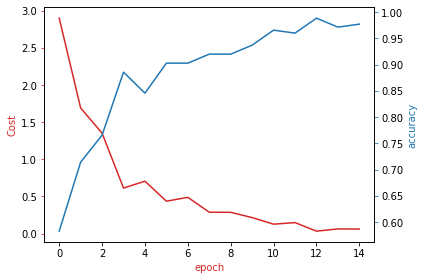

In [ ]:
# Plot the Loss and Accuracy vs Epoch graph

fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.plot(fit_history.history['loss'], color=color)
ax1.set_xlabel('epoch', color=color)
ax1.set_ylabel('Cost', color=color)
ax1.tick_params(axis='y', color=color)
    
ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('accuracy', color=color) 
ax2.set_xlabel('epoch', color=color)
ax2.plot( fit_history.history['accuracy'], color=color)
ax2.tick_params(axis='y', color=color)
fig.tight_layout()

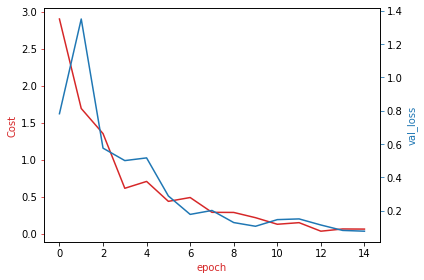

In [ ]:
# Plot the Loss and Accuracy vs Epoch graph

fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.plot(fit_history.history['loss'], color=color)
ax1.set_xlabel('epoch', color=color)
ax1.set_ylabel('Cost', color=color)
ax1.tick_params(axis='y', color=color)
    
ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('val_loss', color=color) 
ax2.set_xlabel('epoch', color=color)
ax2.plot( fit_history.history['val_loss'], color=color)
ax2.tick_params(axis='y', color=color)
fig.tight_layout()

In [ ]:
def classify(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)

    img_batch = np.expand_dims(img_array, axis=0)

    img_preprocessed = preprocess_input(img_batch)

    prediction = model.predict(img_preprocessed, verbose=0)

    img = cv2.imread(img_path)
    plt.figure(figsize=(10,10))
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()
    pred_label = (prediction[0][0]>0.5)
    if (pred_label == False):
      print("Stop")
    else:
      print("Not Stop")


/content/test_set_stop_not_stop/not_stop_4.jpeg


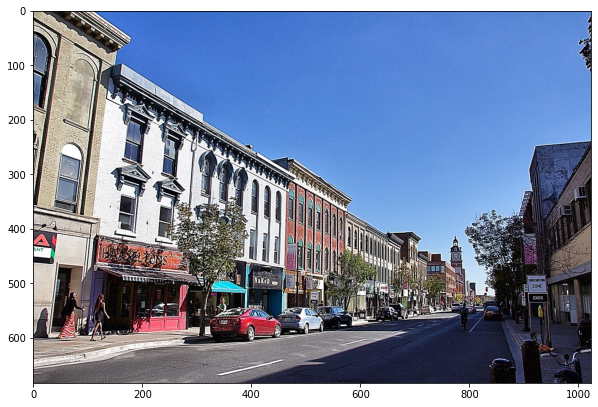

Not Stop

/content/test_set_stop_not_stop/not_stop_3.jpeg


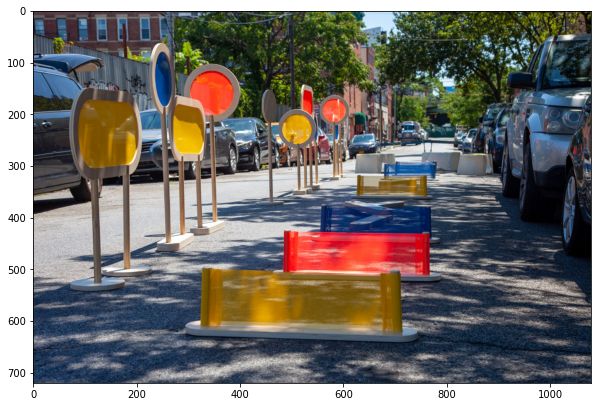

Not Stop

/content/test_set_stop_not_stop/stop_1.jpeg


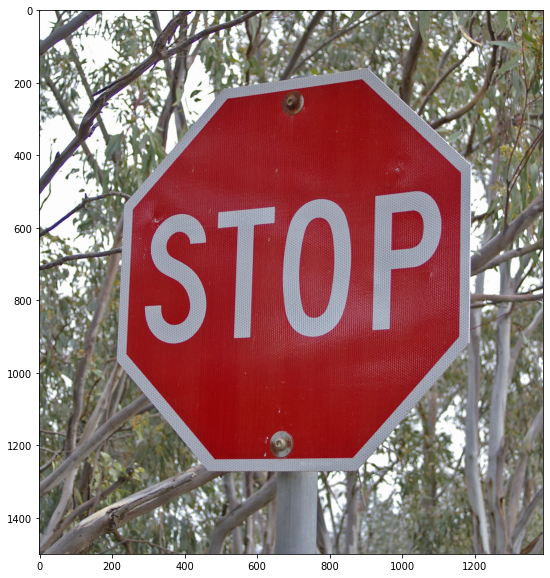

Stop

/content/test_set_stop_not_stop/stop_2.jpeg


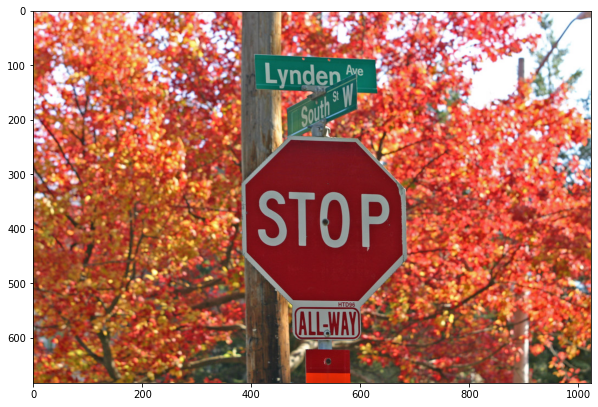

Stop

/content/test_set_stop_not_stop/not_stop_2.jpeg


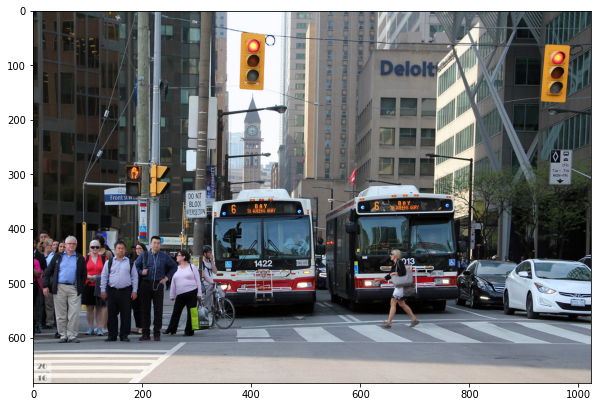

Not Stop

/content/test_set_stop_not_stop/stop_4.jpeg


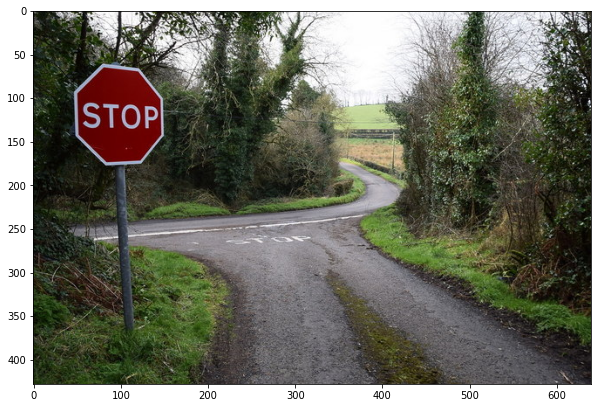

Stop

/content/test_set_stop_not_stop/not_stop_1.jpeg


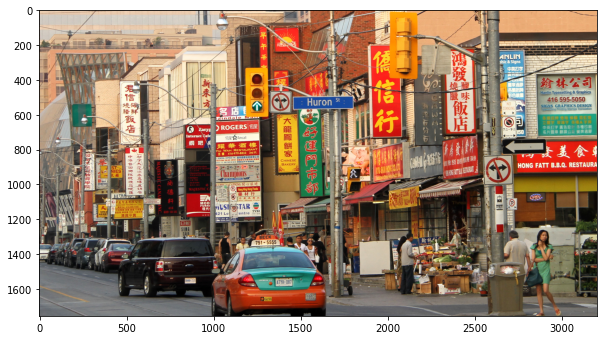

Not Stop

/content/test_set_stop_not_stop/stop_3.jpeg


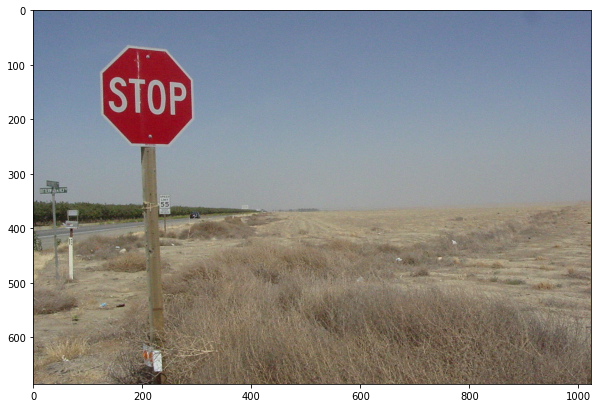

Stop



In [ ]:
for path in test_files:
  print(path)
  classify(path)
  print("")

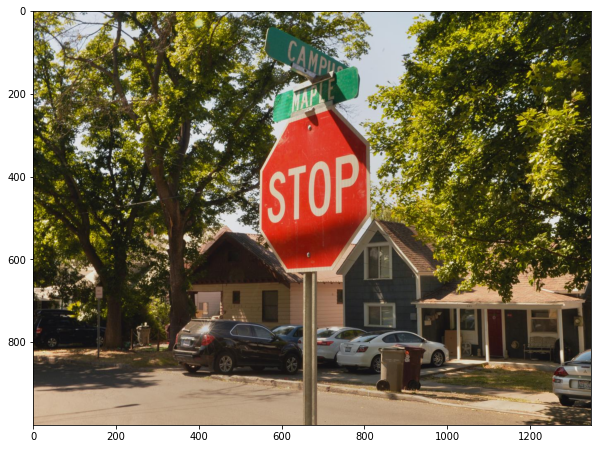

Stop


In [ ]:
classify('/content/Online_Stop.jpg')

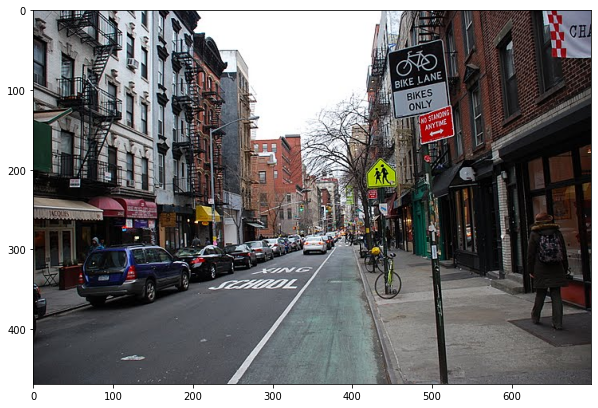

Not Stop


In [ ]:
classify('/content/Online_not_stop.jpg')

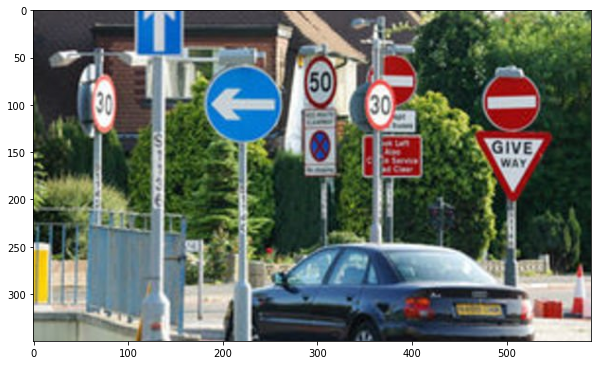

Stop


In [ ]:
classify('/content/277335_1.jpg')

In [ ]:
stop_files_path = '/content/train/stop'
not_stop_files_path = '/content/train/not_stop'
stop_files=[os.path.join(stop_files_path,file) for file in  os.listdir(stop_files_path) if file.endswith(".jpg") or file.endswith(".webp")]
not_stop_files=[os.path.join(not_stop_files_path,file) for file in  os.listdir(not_stop_files_path) if file.endswith(".jpg") or file.endswith(".jfif")]
all_files = stop_files + not_stop_files
label_train = []
for i in range (len(stop_files)):
  label_train.append(1)
for i in range (len(not_stop_files)):
  label_train.append(0)

X_train, X_val, y_train, y_val = train_test_split(all_files, label_train, test_size=0.05, random_state=1234)

In [ ]:
data_generator = ImageDataGenerator(
    preprocessing_function=preprocess_input,
    validation_split=0.20
)

train_generator = data_generator.flow_from_directory(
    '/content/train',
    target_size=(image_resize, image_resize),
    batch_size=batch_size_training, 
    class_mode='categorical',
    subset='training',
    shuffle=True,
    seed=42
    )

validation_generator = data_generator.flow_from_directory(
    '/content/train',
    target_size=(image_resize, image_resize),
    batch_size=batch_size_validation,
    class_mode='categorical',
    subset='validation',
    shuffle=True,
    seed=42
    )

Found 193 images belonging to 2 classes.
Found 47 images belonging to 2 classes.


In [ ]:
model2 = Sequential()
model2.add(ResNet50(
    include_top=False, 
    pooling='avg',
    weights='imagenet',
    ))
model2.add(Dense(512,activation='relu'))
model2.add(Dropout(0.1))
model2.add(Dense(1024,activation='relu'))
model2.add(Dropout(0.1))
model2.add(Dense(512,activation='relu'))
model2.add(Dropout(0.1))
model2.add(Dense(256,activation='relu'))
model2.add(Dropout(0.1))
model2.add(Dense(512,activation='relu'))
model2.add(Dropout(0.1))
model2.add(Dense(num_classes, activation='softmax'))
model2.layers

In [ ]:
model2.layers[0].trainable = False

In [ ]:
model2.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dense_39 (Dense)            (None, 512)               1049088   
                                                                 
 dropout_31 (Dropout)        (None, 512)               0         
                                                                 
 dense_40 (Dense)            (None, 1024)              525312    
                                                                 
 dropout_32 (Dropout)        (None, 1024)              0         
                                                                 
 dense_41 (Dense)            (None, 512)               524800    
                                                                 
 dropout_33 (Dropout)        (None, 512)              

In [ ]:
model2.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy']) 

In [ ]:
np.random.seed(1234)
fit_history = model2.fit_generator( 
    train_generator,
    steps_per_epoch=steps_per_epoch_training,
    epochs=num_epochs,
    validation_data=validation_generator,
    validation_steps=steps_per_epoch_validation,
    verbose=1,
)

<ipython-input-129-150cb5d0fdbc>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  fit_history = model2.fit_generator(


Epoch 1/15
2/2 [==============================] - 14s 8s/step - loss: 0.9021 - accuracy: 0.5078 - val_loss: 1.1056 - val_accuracy: 0.5319
Epoch 2/15
2/2 [==============================] - 8s 5s/step - loss: 0.8889 - accuracy: 0.5233 - val_loss: 0.7080 - val_accuracy: 0.4681
Epoch 3/15
2/2 [==============================] - 8s 5s/step - loss: 0.6538 - accuracy: 0.6010 - val_loss: 0.4924 - val_accuracy: 0.8936
Epoch 4/15
2/2 [==============================] - 8s 5s/step - loss: 0.4619 - accuracy: 0.8187 - val_loss: 0.3011 - val_accuracy: 0.8936
Epoch 5/15
2/2 [==============================] - 8s 5s/step - loss: 0.3660 - accuracy: 0.8446 - val_loss: 0.2163 - val_accuracy: 0.9362
Epoch 6/15
2/2 [==============================] - 8s 5s/step - loss: 0.2240 - accuracy: 0.9275 - val_loss: 0.1990 - val_accuracy: 0.9362
Epoch 7/15
2/2 [==============================] - 8s 5s/step - loss: 0.1966 - accuracy: 0.9326 - val_loss: 0.1977 - val_accuracy: 0.9362
Epoch 8/15
2/2 [========================

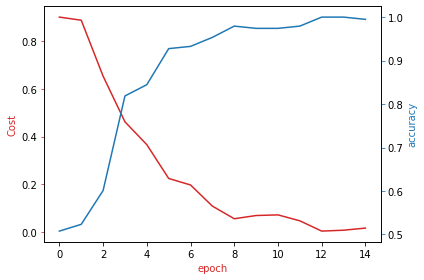

In [ ]:
# Plot the Loss and Accuracy vs Epoch graph

fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.plot(fit_history.history['loss'], color=color)
ax1.set_xlabel('epoch', color=color)
ax1.set_ylabel('Cost', color=color)
ax1.tick_params(axis='y', color=color)
    
ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('accuracy', color=color) 
ax2.set_xlabel('epoch', color=color)
ax2.plot( fit_history.history['accuracy'], color=color)
ax2.tick_params(axis='y', color=color)
fig.tight_layout()

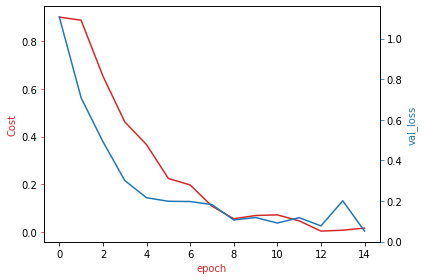

In [ ]:
# Plot the Loss and Accuracy vs Epoch graph

fig, ax1 = plt.subplots()
color = 'tab:red'
ax1.plot(fit_history.history['loss'], color=color)
ax1.set_xlabel('epoch', color=color)
ax1.set_ylabel('Cost', color=color)
ax1.tick_params(axis='y', color=color)
    
ax2 = ax1.twinx()  
color = 'tab:blue'
ax2.set_ylabel('val_loss', color=color) 
ax2.set_xlabel('epoch', color=color)
ax2.plot( fit_history.history['val_loss'], color=color)
ax2.tick_params(axis='y', color=color)
fig.tight_layout()

/content/test_set_stop_not_stop/not_stop_4.jpeg


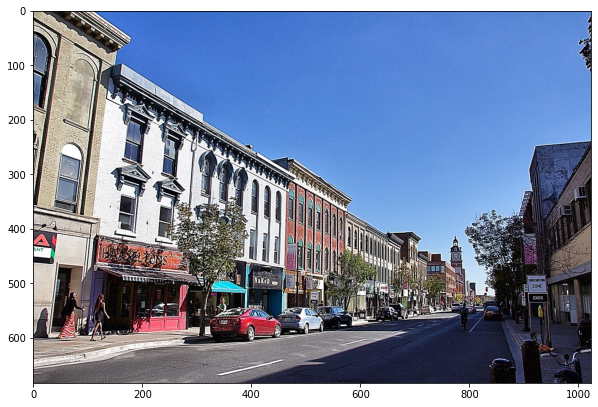

Not Stop

/content/test_set_stop_not_stop/not_stop_3.jpeg


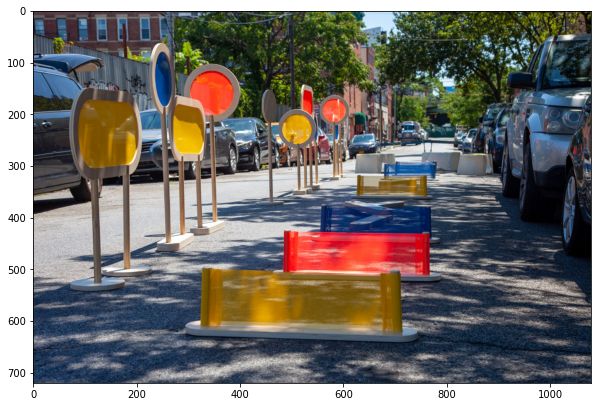

Not Stop

/content/test_set_stop_not_stop/stop_1.jpeg


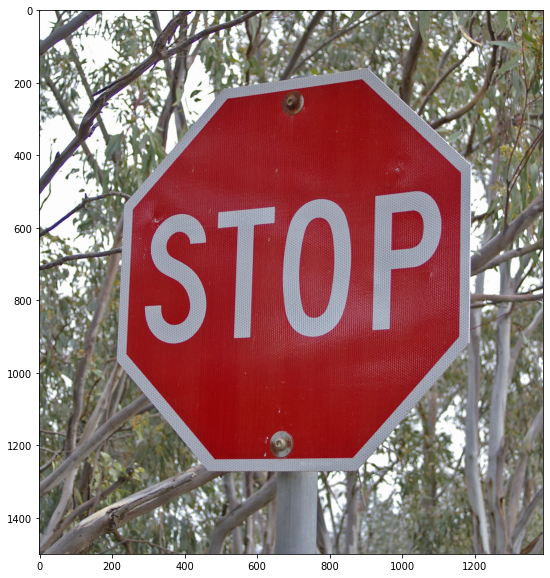

Stop

/content/test_set_stop_not_stop/stop_2.jpeg


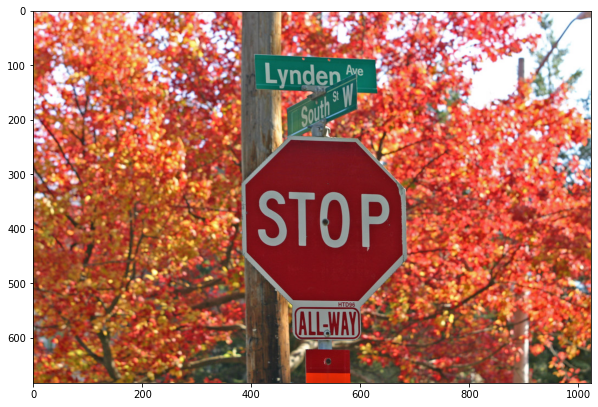

Stop

/content/test_set_stop_not_stop/not_stop_2.jpeg


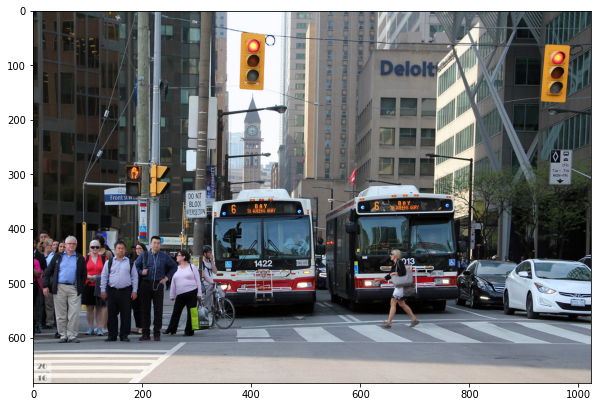

Not Stop

/content/test_set_stop_not_stop/stop_4.jpeg


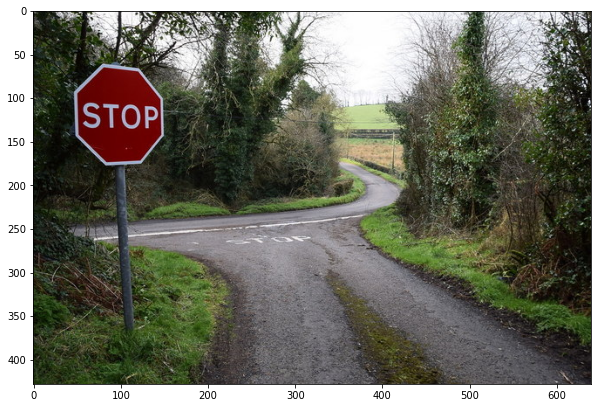

Stop

/content/test_set_stop_not_stop/not_stop_1.jpeg


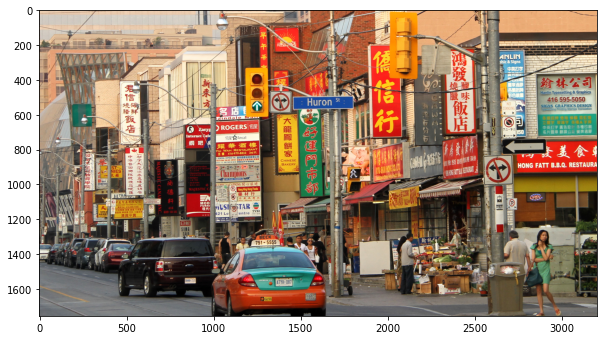

Not Stop

/content/test_set_stop_not_stop/stop_3.jpeg


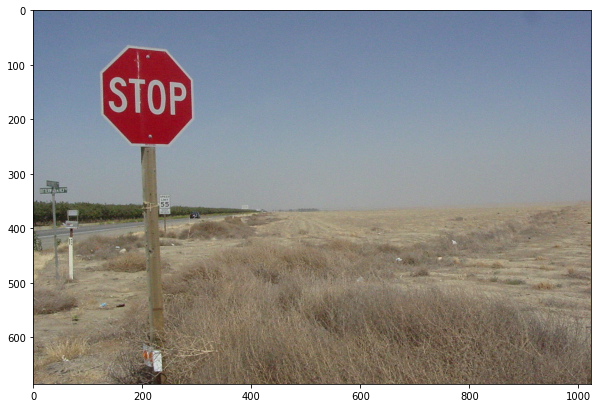

Stop



In [ ]:
for path in test_files:
  print(path)
  classify(path)
  print("")

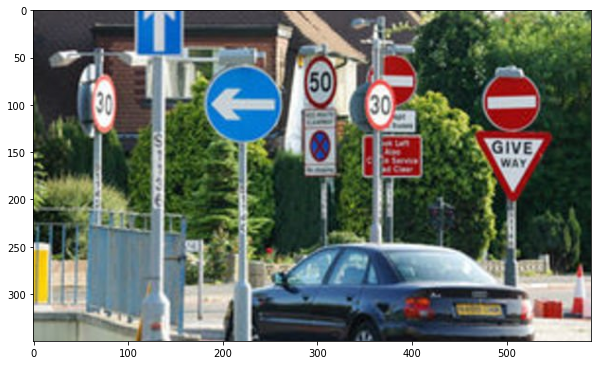

Not Stop


In [ ]:
classify('/content/277335_1.jpg')